In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import jupyter_black

jupyter_black.load()

In [3]:
import numpy as np
from scipy.io.wavfile import read

from acoustics.impulse import convolve_display
from acoustics.plot import compare, compare_impulse_responses, plot
from acoustics.porous_absorbers import materials, porous_absorber
from acoustics.rew import rew_impulse_responses, rew_measurements, rew_rt60s

In [4]:
# Data pulled from decay-time
%store -r volume

In [5]:
sample_rate, sample_data = read("../sounds/satellite.wav")

In [6]:
directory = "data/2024-08-25_cloud"
measurements = rew_measurements(directory)
rt60s = rew_rt60s(directory)
impulse_responses = rew_impulse_responses(directory)

# load the untreated room impulse response for before/after listening down at the bottom
impulse_responses.update(rew_impulse_responses("data/2024-05-07_front"))

rate = next(iter(impulse_responses.values()))["rate"]

## Could Treatments

3d model of the room with the treatments under test highlighted:

<img src="../images/cloud-model.png" width=500/>

There are sixteen cells each of which is roughly 20" square and 6" deep. The eight cells nearest the seating are 6" 2D QRD difussors. The far eight are filled with two layers of Rockwool R15 for a total of ~6" of porous absorbent and there's a ~3.5" air gap above that to the ceiling for an effective depth of ~9.5".

RW Safe n Sound 3"'s material sigma is 10000α
Its thickness is 0.152m with an air gap of 0.089m
Its modeled average absorption coefficent is 0.8640915361864414
Resulting in an average Sa of 0.2229909181944179 per cell and predicted reduction of 15ms for all 8



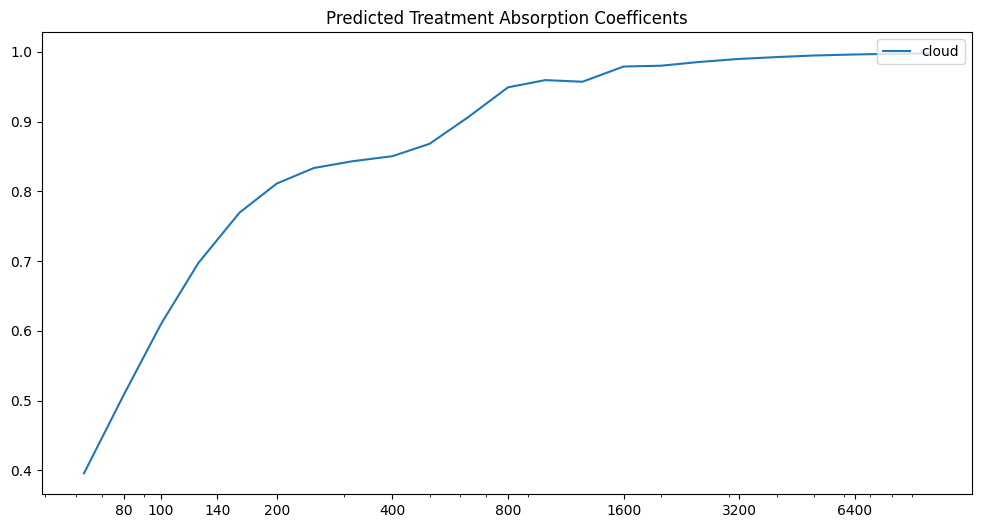

In [7]:
f = rt60s["bns-back12-side12-p1-l"]["freq"]
existing_Tm = rt60s["bns-back12-side12-p1-l"]["topt"]
existing_Sa = 0.161 * volume / existing_Tm

name = 'RW Safe n Sound 3"'
material = materials[name]
print(f"{name}'s material sigma is {material['sigma']}α")
thickness = 0.1524
air_gap = 0.0889
print(f"Its thickness is {thickness:.3f}m with an air gap of {air_gap:.3f}m")

data = {
    "a": porous_absorber(
        f,
        sigma=material["sigma"],
        thickness=thickness,
        air_gap=air_gap,
    ),
    "width": 0.508,
    "height": 0.508,
}
print(f"Its modeled average absorption coefficent is {np.average(data['a'])}")
data["Sa"] = data["a"] * (data["width"] * data["height"])
new_Sa = existing_Sa + data["Sa"]
new_Tm = 0.161 * volume / new_Sa
data["dTm"] = (existing_Tm - new_Tm) * 1000.0 * 8
print(
    f"Resulting in an average Sa of {np.average(data['Sa'])} per cell and predicted reduction of {np.average(data['dTm']):.0f}ms for all 8"
)
print("")

ax = plot(
    f,
    {"cloud": data["a"]},
    title="Predicted Treatment Absorption Coefficents",
)

In [8]:
def compare_measurements(a, b, title):
    a_data = measurements[a]
    freq = a_data["freq"]
    skip = len(freq[freq <= 30])
    ax1, ax2 = compare(
        a_data["freq"][skip:],
        a,
        a_data["spl"][skip:],
        b,
        measurements[b]["spl"][skip:],
        f"{title} - SPL",
    )

## All 8 Treatments

As described above. Minimal impact on the frequency response.

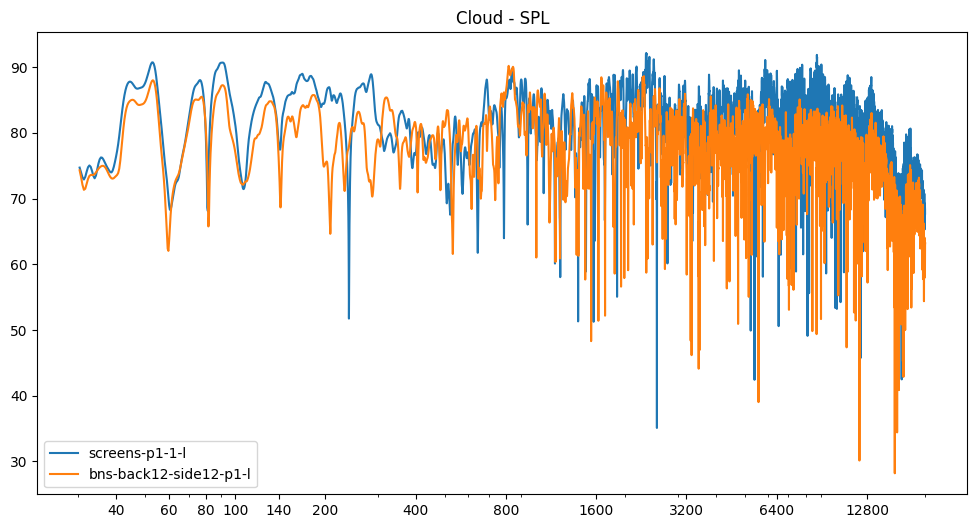

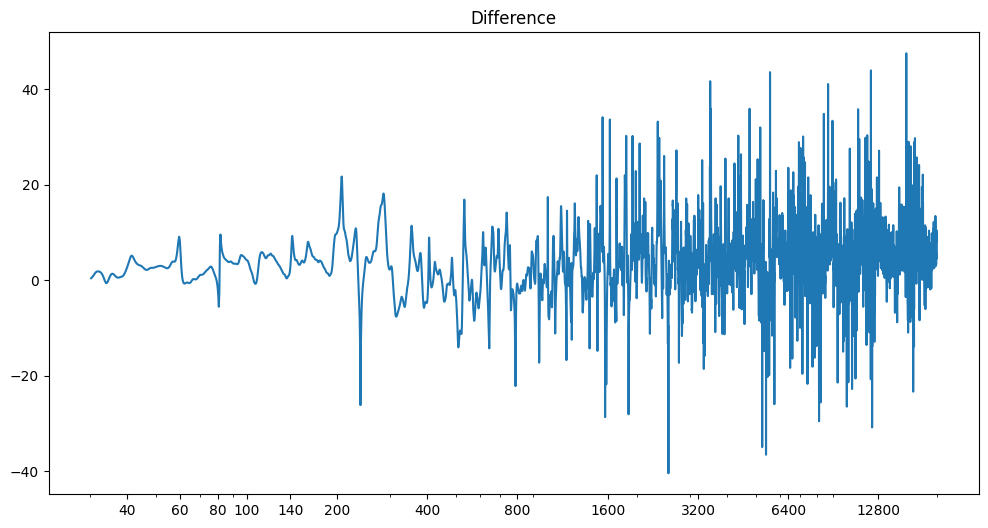

In [9]:
compare_measurements("screens-p1-1-l", "bns-back12-side12-p1-l", "Cloud")

In [10]:
def compare_topts(a, b, title, dTm=None):
    a_data = rt60s[a]
    b_data = rt60s[b]
    change = np.average(a_data["topt"]) - np.average(b_data["topt"])
    ax1, ax2 = compare(
        a_data["freq"],
        a,
        a_data["topt"],
        b,
        b_data["topt"],
        f"{title}: {change*1000:.0f}ms",
    )
    ax1.set_ylabel("secs")

    if dTm is not None:
        ax2.plot(a_data["freq"], dTm / -1000.0, label="Predicted", color="green")
        ax2.legend(loc="lower left")
    ax2.set_ylabel("secs")
    ax2.axhline(0, color="black")


def per_channel_topts(a, b):
    print(f"topt({b}) topt({a}) change")
    for ch in ("l", "r", "c"):
        a_avg = np.average(rt60s[f"{a}-{ch}"]["topt"])
        b_avg = np.average(rt60s[f"{b}-{ch}"]["topt"])
        change = a_avg - b_avg
        print(f"{ch:3s} {b_avg*1000:.0f}ms {a_avg*1000:.0f}ms {change*1000:.0f}ms")

The model calculated an 15ms reduction for this treatment. We saw a 72ms drop for the left channel, and much more modest 16 and 33ms for right and center respective.

In [11]:
per_channel_topts("screens-p1-1", "bns-back12-side12-p1")

topt(bns-back12-side12-p1) topt(screens-p1-1) change
l   269ms 244ms -25ms
r   292ms 254ms -38ms
c   267ms 235ms -33ms


Left channel decay time saw an average reduction of a 25ms, about 10ms more than the prediction. Right and center saw 38ms and 33ms respectively, almost double what was predicted. The reductions were focused between 300Hz and 3200Hz. 

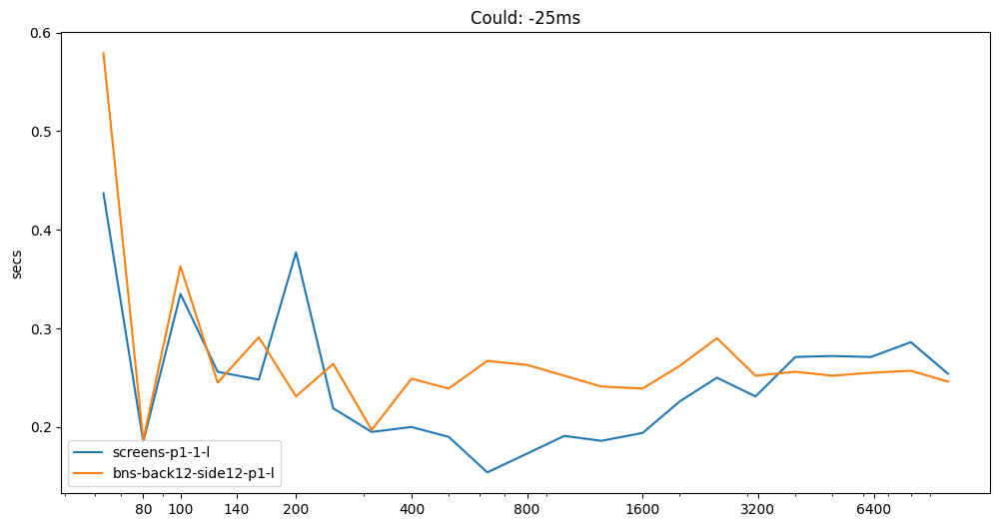

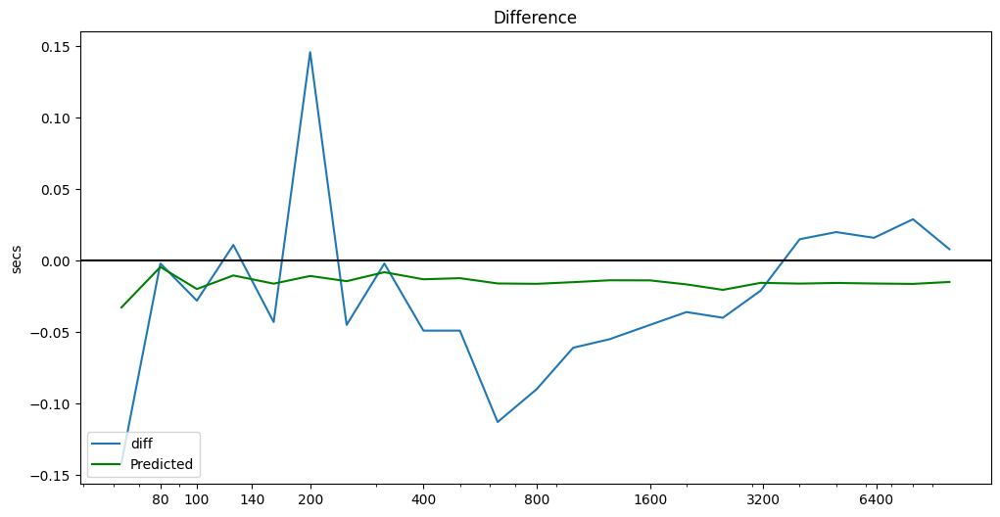

In [12]:
compare_topts("screens-p1-1-l", "bns-back12-side12-p1-l", "Could", dTm=data["dTm"])

### Impulse Responses

There's not a lot of impact visible to the impulse response. There's a bit of an increase just short of 9ms, but it's not clear what that can be attributed to and may be an artifact of taking measurements many weeks apart with slightly different microphone positions.

The eight 2D QRDs would also be included in the changes here, but at this resolution there's no discernable impacts to the impulse response. Listening tests with blanking covers in place vs the QRDs did result seem to show a difference, especially to the surround speakers which in their temporary location fire up into them.

In [13]:
def compare_ir(a, b, title, tmax=1.0):
    a_data = impulse_responses[a]["data"][impulse_responses[a]["start"] :]
    b_data = impulse_responses[b]["data"][impulse_responses[b]["start"] :]
    ax = compare_impulse_responses(rate, a, a_data, b, b_data, title, tmax=tmax)

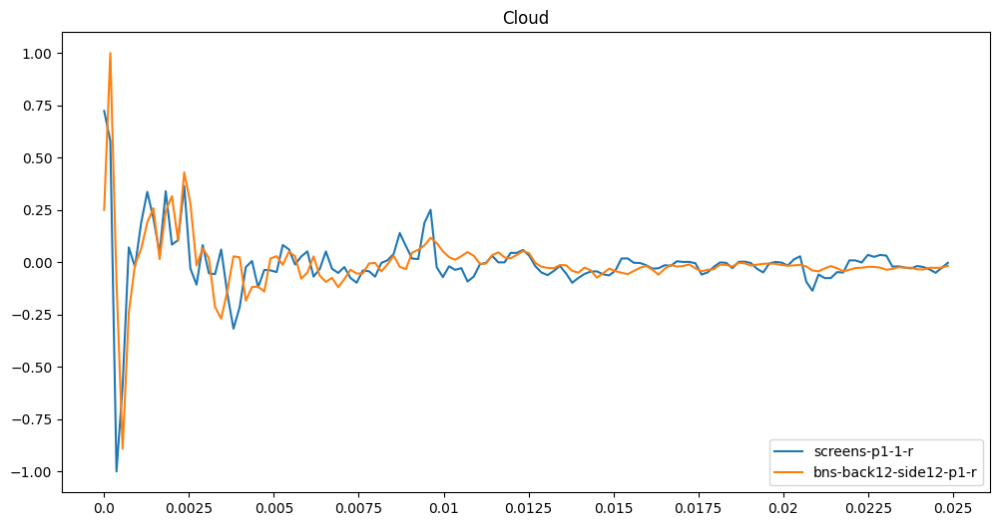

In [14]:
compare_ir("screens-p1-1-r", "bns-back12-side12-p1-r", "Cloud", tmax=0.025)

# Listening Simulations.

We'll compare the room without treatments, from the before in the front-treatments notebook, to the before from this notebook, and finally to the after with all the front and back/side treatments placed.

The diference should be fairly apparent, especially comparing the first and last.

In [15]:
convolve_display(
    sample_data, sample_rate, impulse_responses["front-frames-p1-l"]["data"]
)

In [16]:
convolve_display(
    sample_data, sample_rate, impulse_responses["bns-back12-side12-p1-l"]["data"]
)

In [17]:
convolve_display(sample_data, sample_rate, impulse_responses["screens-p1-1-l"]["data"])